In [13]:
import os
import random
from pathlib import Path
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils
from PIL import Image
import matplotlib.pyplot as plt

In [14]:
# -----------------------
# Config
# -----------------------
DATA_DIR = Path("/kaggle/input/animefacedataset/images")  # <- your folder (flat images)
SAVE_DIR = Path("/kaggle/working/wgan_anime")
SAVE_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42
random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)

IMAGE_SIZE = 64          # choose 64 or 128 (if 128 may need more GPU memory)
BATCH_SIZE = 64
LATENT_DIM = 128
CHANNELS_IMG = 3
EPOCHS = 30              # increase on Kaggle Pro or local
LR = 1e-3
CRITIC_ITER = 5          # number of D updates per G update
LAMBDA_GP = 10
NUM_WORKERS = 2          # <-- set to 0 for notebook stability

print("Device:", DEVICE)
print("Save to:", SAVE_DIR)

Device: cuda
Save to: /kaggle/working/wgan_anime


In [15]:
# -----------------------
# Dataset (flat image folder)
# -----------------------
class FlatImageFolder(Dataset):
    def __init__(self, root: Path, transform=None):
        self.root = Path(root)
        exts = (".png", ".jpg", ".jpeg", ".bmp", ".webp")
        # gather files directly under folder; if none, search recursively
        self.paths = [p for p in self.root.iterdir() if p.suffix.lower() in exts]
        if not self.paths:
            self.paths = list(self.root.rglob("*"))
            self.paths = [p for p in self.paths if p.suffix.lower() in exts]
        if len(self.paths) == 0:
            raise RuntimeError(f"No images found in {root}")
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        p = self.paths[idx]
        img = Image.open(p).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img

In [16]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])  # map to [-1,1]
])

In [17]:
dataset = FlatImageFolder(DATA_DIR, transform=transform)
print("Found images:", len(dataset))

Found images: 63565


In [18]:
loader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,   # safe for Kaggle notebooks
    pin_memory=True if DEVICE=="cuda" else False,
    drop_last=True
)

# Generator

In [19]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g=64):
        super().__init__()
        self.net = nn.Sequential(
            # input: (N, z_dim, 1, 1)
            nn.ConvTranspose2d(z_dim, features_g * 8, kernel_size=4, stride=1, padding=0, bias=False), # 4x4
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(features_g * 8, features_g * 4, 4, 2, 1, bias=False), # 8x8
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(features_g * 4, features_g * 2, 4, 2, 1, bias=False), # 16x16
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(features_g * 2, features_g, 4, 2, 1, bias=False), # 32x32
            nn.BatchNorm2d(features_g),
            nn.ReLU(True),
            nn.ConvTranspose2d(features_g, channels_img, 4, 2, 1, bias=False), # 64x64
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

# Discriminator

In [20]:
class Critic(nn.Module):
    def __init__(self, channels_img, features_d=64):
        super().__init__()
        self.net = nn.Sequential(
            # input: (N, channels_img, 64,64)
            nn.Conv2d(channels_img, features_d, 4, 2, 1, bias=False),  # 32x32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(features_d, features_d*2, 4, 2, 1, bias=False),  # 16x16
            nn.InstanceNorm2d(features_d*2, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(features_d*2, features_d*4, 4, 2, 1, bias=False), # 8x8
            nn.InstanceNorm2d(features_d*4, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(features_d*4, features_d*8, 4, 2, 1, bias=False), # 4x4
            nn.InstanceNorm2d(features_d*8, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=1, padding=0, bias=False), # 1x1
        )

    def forward(self, x):
        return self.net(x).view(x.size(0), -1)  # (N, 1)

In [21]:
# -----------------------
# Instantiate
# -----------------------
gen = Generator(LATENT_DIM, CHANNELS_IMG).to(DEVICE)
critic = Critic(CHANNELS_IMG).to(DEVICE)

opt_gen = optim.Adam(gen.parameters(), lr=LR, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LR, betas=(0.0, 0.9))

# Gradient penalty


In [22]:
def gradient_penalty(critic, real, fake, device="cpu"):
    B, C, H, W = real.shape
    alpha = torch.rand(B, 1, 1, 1, device=device).expand_as(real)
    interpolated = real * alpha + fake * (1 - alpha)
    interpolated.requires_grad_(True)
    mixed_scores = critic(interpolated)
    grad_outputs = torch.ones_like(mixed_scores, device=device)
    gradients = torch.autograd.grad(
        outputs=mixed_scores,
        inputs=interpolated,
        grad_outputs=grad_outputs,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]  # (B, C, H, W)
    gradients = gradients.view(gradients.size(0), -1)
    grad_norm = gradients.norm(2, dim=1)
    gp = ((grad_norm - 1) ** 2).mean()
    return gp


In [23]:
# -----------------------
# Helpers: sample & save
# -----------------------
fixed_noise = torch.randn(64, LATENT_DIM, 1, 1, device=DEVICE)

def save_samples(gen_model, epoch, nrow=8, fname=None):
    gen_model.eval()
    with torch.no_grad():
        imgs = gen_model(fixed_noise).detach().cpu()
    grid = utils.make_grid(imgs, nrow=nrow, normalize=True, value_range=(-1,1))
    out_path = SAVE_DIR / (fname or f"samples_epoch_{epoch:04d}.png")
    utils.save_image(grid, out_path)
    gen_model.train()
    return out_path

# Training

Starting training...


Epoch [1/30]:   0%|          | 0/993 [00:00<?, ?it/s]

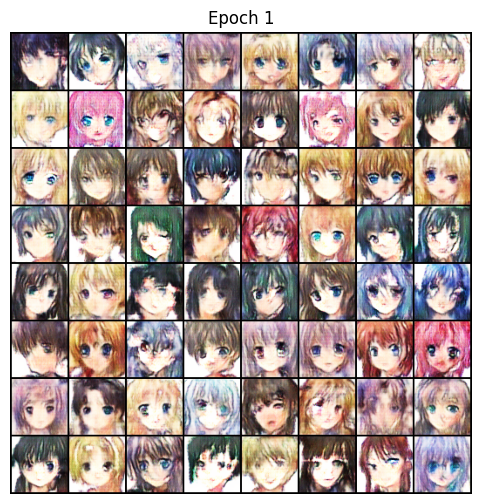

Epoch 1 -> saved /kaggle/working/wgan_anime/samples_epoch_0001.png


Epoch [2/30]:   0%|          | 0/993 [00:00<?, ?it/s]

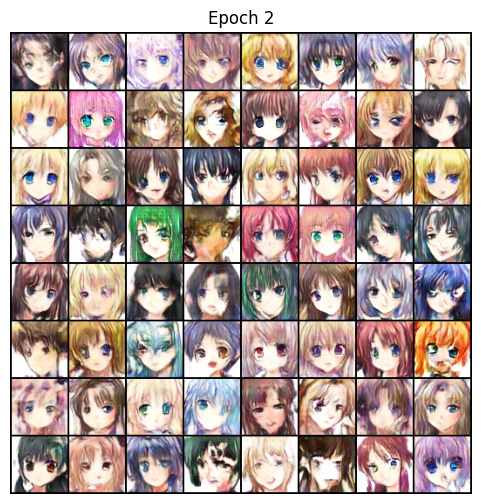

Epoch 2 -> saved /kaggle/working/wgan_anime/samples_epoch_0002.png


Epoch [3/30]:   0%|          | 0/993 [00:00<?, ?it/s]

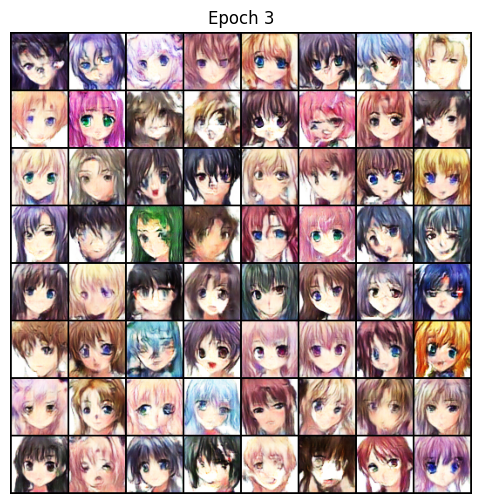

Epoch 3 -> saved /kaggle/working/wgan_anime/samples_epoch_0003.png


Epoch [4/30]:   0%|          | 0/993 [00:00<?, ?it/s]

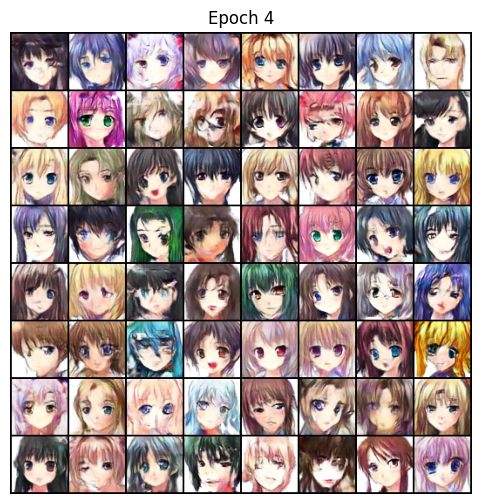

Epoch 4 -> saved /kaggle/working/wgan_anime/samples_epoch_0004.png


Epoch [5/30]:   0%|          | 0/993 [00:00<?, ?it/s]

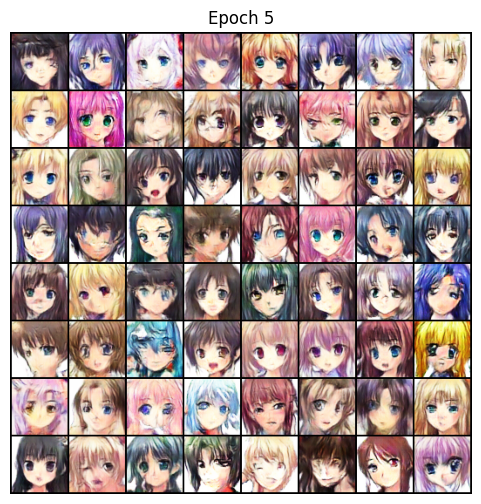

Epoch 5 -> saved /kaggle/working/wgan_anime/samples_epoch_0005.png
Saved models at epoch 5


Epoch [6/30]:   0%|          | 0/993 [00:00<?, ?it/s]

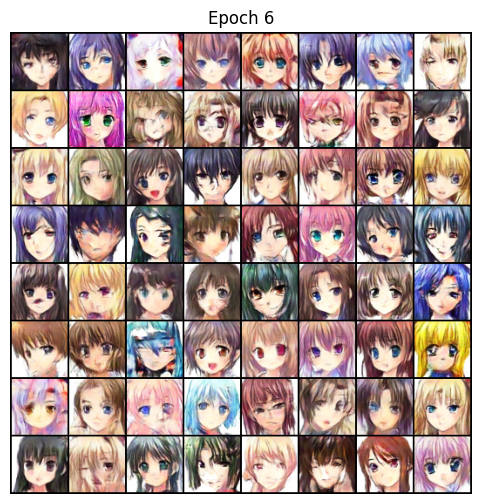

Epoch 6 -> saved /kaggle/working/wgan_anime/samples_epoch_0006.png


Epoch [7/30]:   0%|          | 0/993 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
self._shutdown_workers()
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
self._shutdown_workers()    Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1564, in _shutdown_workers


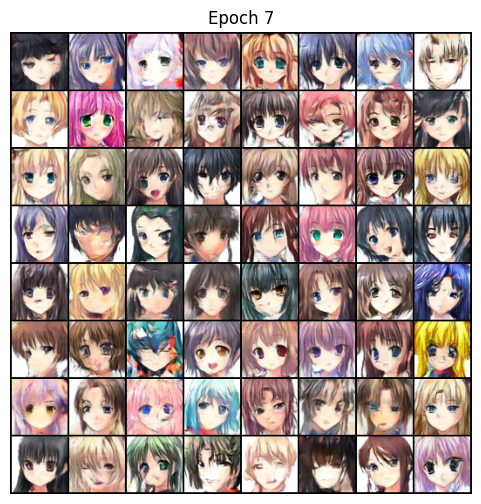

Epoch 7 -> saved /kaggle/working/wgan_anime/samples_epoch_0007.png


Epoch [8/30]:   0%|          | 0/993 [00:00<?, ?it/s]

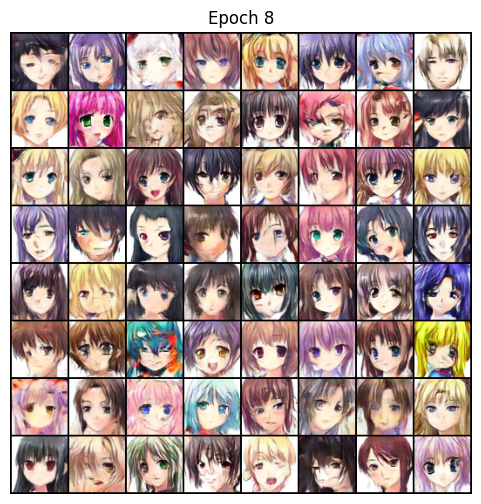

Epoch 8 -> saved /kaggle/working/wgan_anime/samples_epoch_0008.png


Epoch [9/30]:   0%|          | 0/993 [00:00<?, ?it/s]

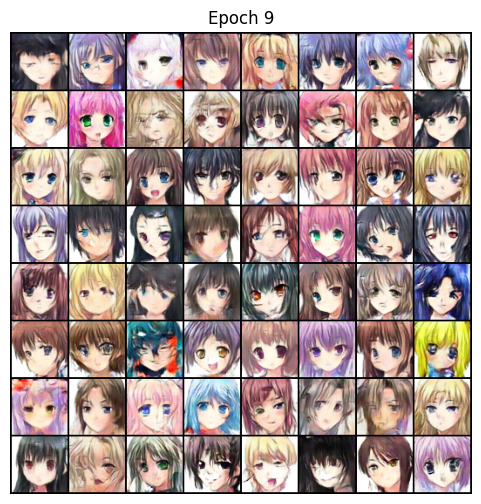

Epoch 9 -> saved /kaggle/working/wgan_anime/samples_epoch_0009.png


Epoch [10/30]:   0%|          | 0/993 [00:00<?, ?it/s]

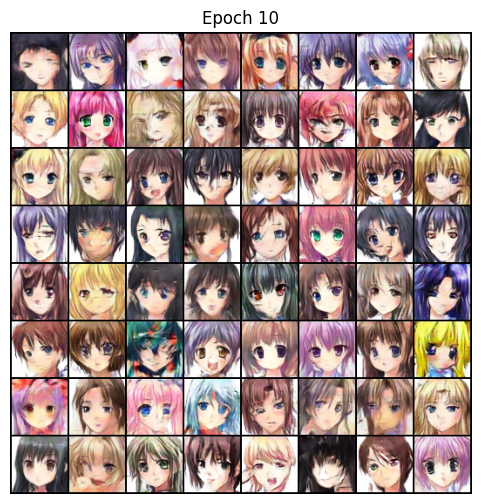

Epoch 10 -> saved /kaggle/working/wgan_anime/samples_epoch_0010.png
Saved models at epoch 10


Epoch [11/30]:   0%|          | 0/993 [00:00<?, ?it/s]

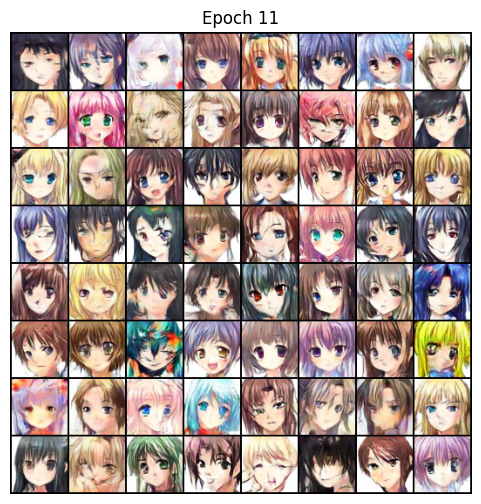

Epoch 11 -> saved /kaggle/working/wgan_anime/samples_epoch_0011.png


Epoch [12/30]:   0%|          | 0/993 [00:00<?, ?it/s]

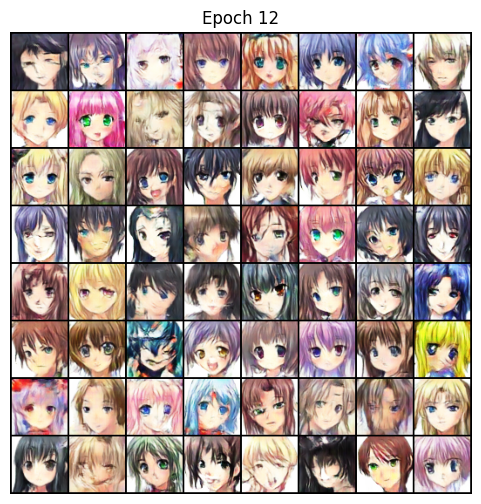

Epoch 12 -> saved /kaggle/working/wgan_anime/samples_epoch_0012.png


Epoch [13/30]:   0%|          | 0/993 [00:00<?, ?it/s]

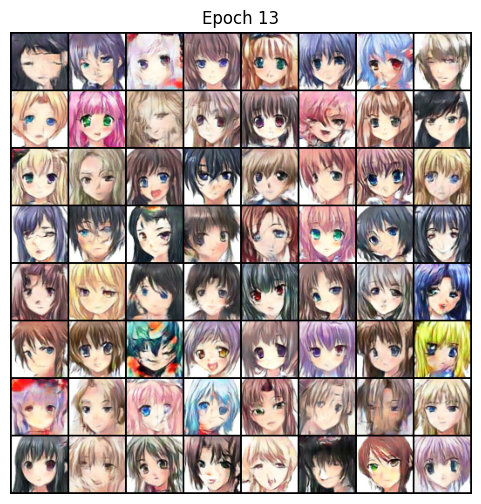

Epoch 13 -> saved /kaggle/working/wgan_anime/samples_epoch_0013.png


Epoch [14/30]:   0%|          | 0/993 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

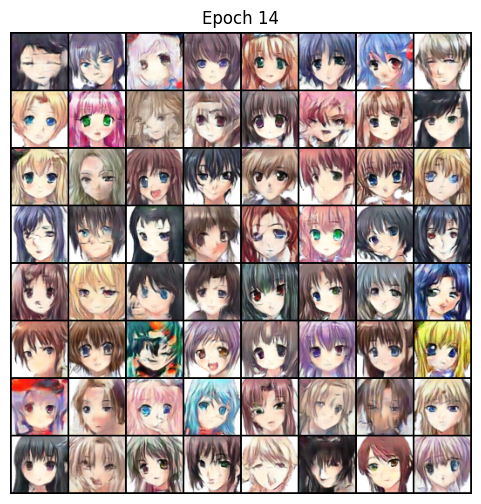

Epoch 14 -> saved /kaggle/working/wgan_anime/samples_epoch_0014.png


Epoch [15/30]:   0%|          | 0/993 [00:00<?, ?it/s]

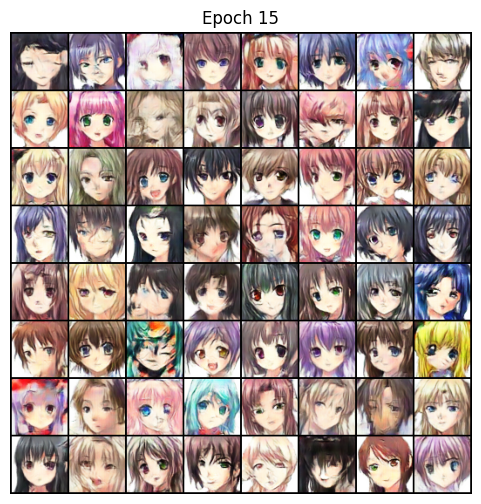

Epoch 15 -> saved /kaggle/working/wgan_anime/samples_epoch_0015.png
Saved models at epoch 15


Epoch [16/30]:   0%|          | 0/993 [00:00<?, ?it/s]

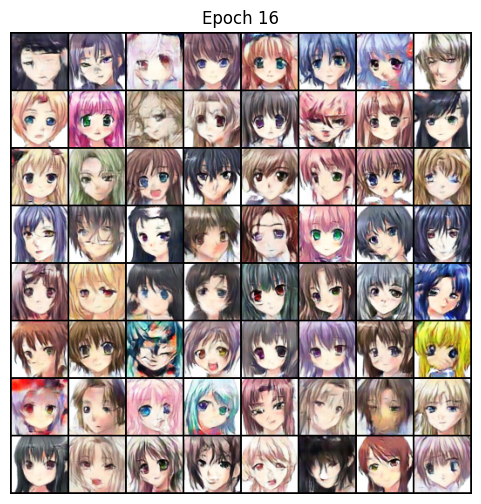

Epoch 16 -> saved /kaggle/working/wgan_anime/samples_epoch_0016.png


Epoch [17/30]:   0%|          | 0/993 [00:00<?, ?it/s]

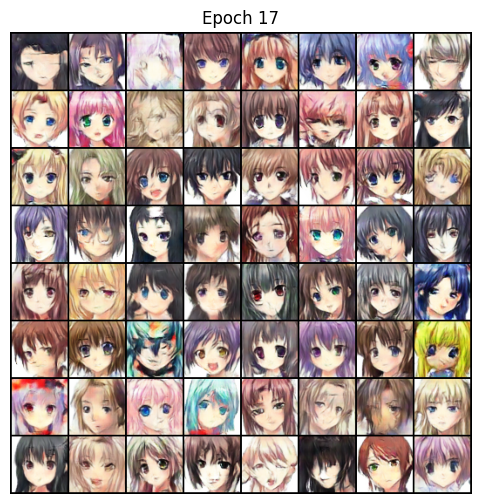

Epoch 17 -> saved /kaggle/working/wgan_anime/samples_epoch_0017.png


Epoch [18/30]:   0%|          | 0/993 [00:00<?, ?it/s]

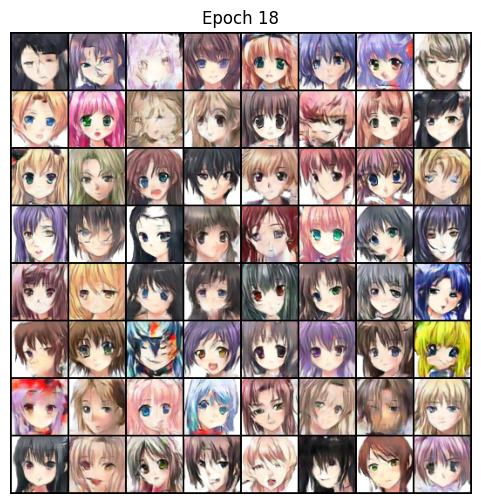

Epoch 18 -> saved /kaggle/working/wgan_anime/samples_epoch_0018.png


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^

Epoch [19/30]:   0%|          | 0/993 [00:00<?, ?it/s]

^^^^Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781f8595e7a0>
^Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
^^    ^^self._shutdown_workers()^

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_alive():

                ^ ^ ^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
^    assert self._parent_pid == os.getpid(), 'can only test a child process'
^  ^^ ^ ^ ^    ^^ ^ ^^^^^^^^^^^^^^^^^^^^^^^
^AssertionError: ^^can only test a child process^
^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


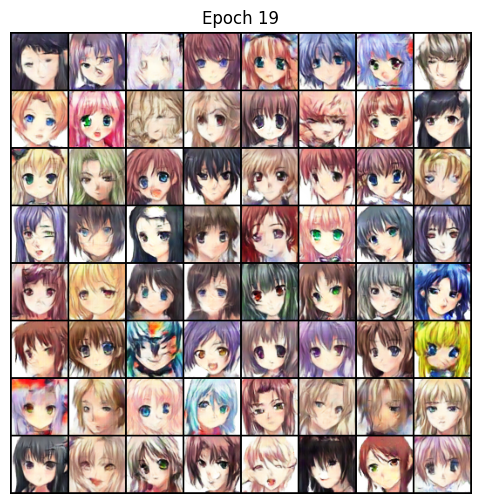

Epoch 19 -> saved /kaggle/working/wgan_anime/samples_epoch_0019.png


Epoch [20/30]:   0%|          | 0/993 [00:00<?, ?it/s]

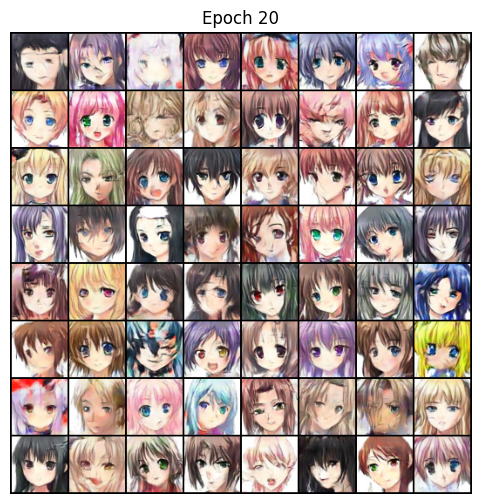

Epoch 20 -> saved /kaggle/working/wgan_anime/samples_epoch_0020.png
Saved models at epoch 20


Epoch [21/30]:   0%|          | 0/993 [00:00<?, ?it/s]

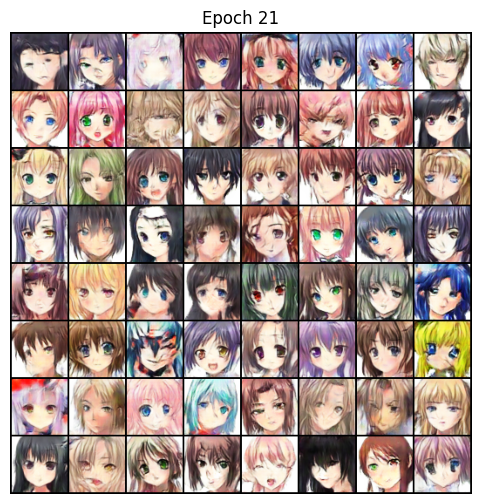

Epoch 21 -> saved /kaggle/working/wgan_anime/samples_epoch_0021.png


Epoch [22/30]:   0%|          | 0/993 [00:00<?, ?it/s]

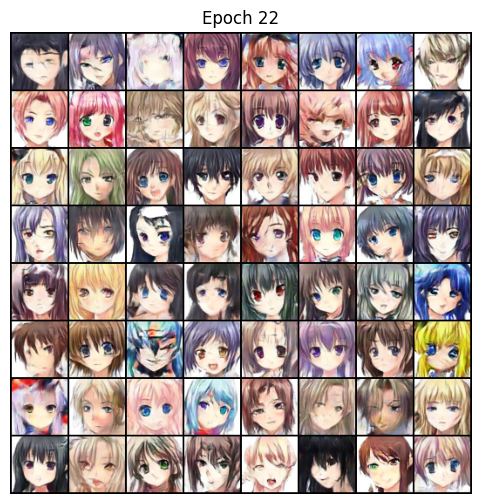

Epoch 22 -> saved /kaggle/working/wgan_anime/samples_epoch_0022.png


Epoch [23/30]:   0%|          | 0/993 [00:00<?, ?it/s]

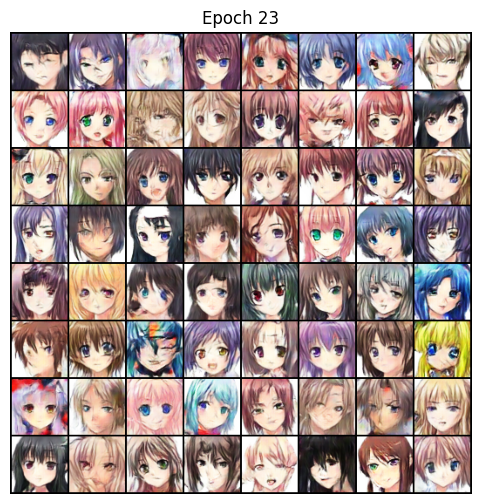

Epoch 23 -> saved /kaggle/working/wgan_anime/samples_epoch_0023.png


Epoch [24/30]:   0%|          | 0/993 [00:00<?, ?it/s]

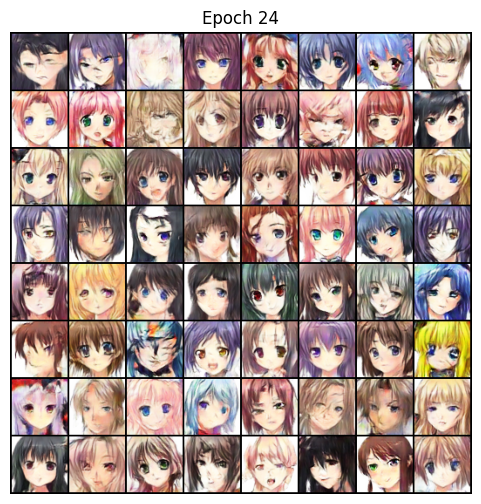

Epoch 24 -> saved /kaggle/working/wgan_anime/samples_epoch_0024.png


Epoch [25/30]:   0%|          | 0/993 [00:00<?, ?it/s]

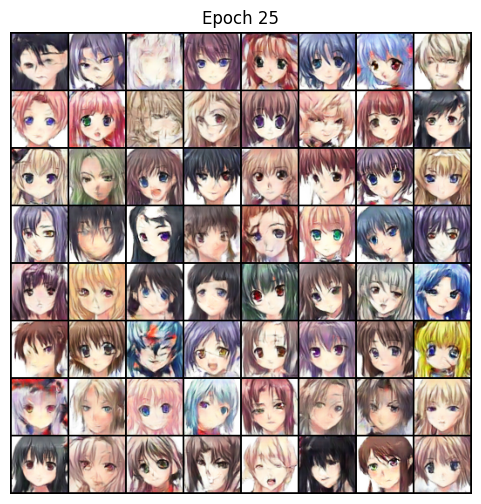

Epoch 25 -> saved /kaggle/working/wgan_anime/samples_epoch_0025.png
Saved models at epoch 25


Epoch [26/30]:   0%|          | 0/993 [00:00<?, ?it/s]

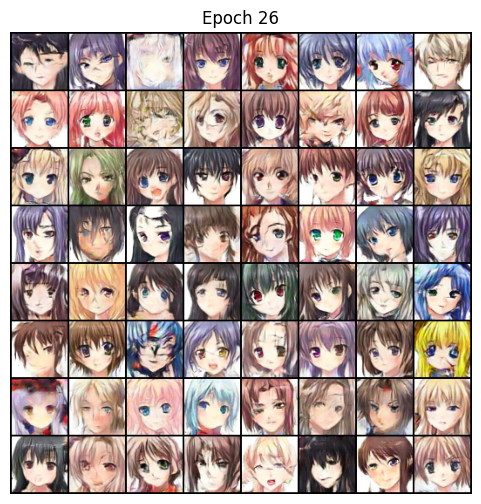

Epoch 26 -> saved /kaggle/working/wgan_anime/samples_epoch_0026.png


Epoch [27/30]:   0%|          | 0/993 [00:00<?, ?it/s]

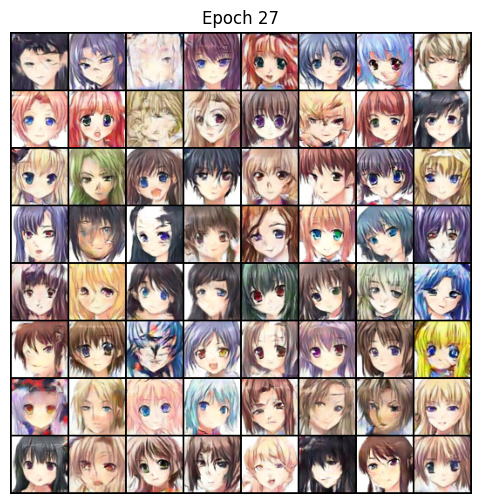

Epoch 27 -> saved /kaggle/working/wgan_anime/samples_epoch_0027.png


Epoch [28/30]:   0%|          | 0/993 [00:00<?, ?it/s]

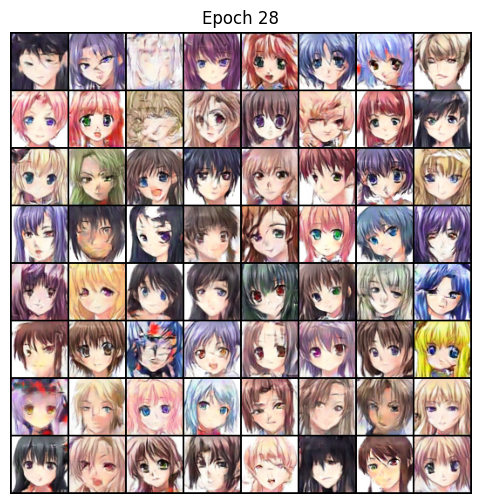

Epoch 28 -> saved /kaggle/working/wgan_anime/samples_epoch_0028.png


Epoch [29/30]:   0%|          | 0/993 [00:00<?, ?it/s]

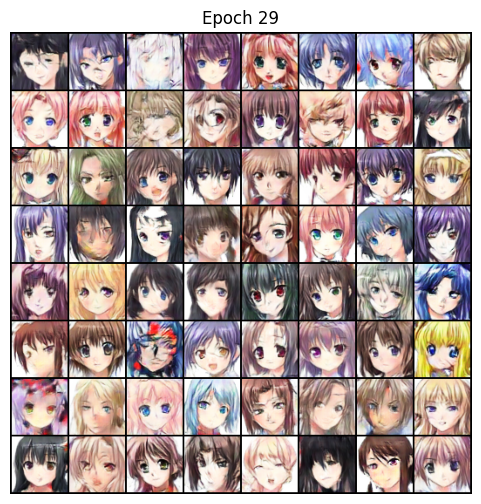

Epoch 29 -> saved /kaggle/working/wgan_anime/samples_epoch_0029.png


Epoch [30/30]:   0%|          | 0/993 [00:00<?, ?it/s]

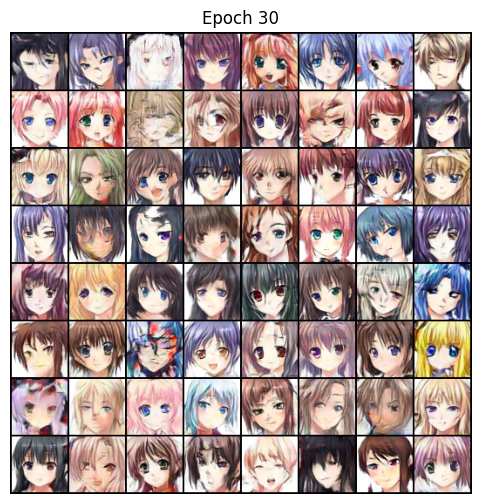

Epoch 30 -> saved /kaggle/working/wgan_anime/samples_epoch_0030.png
Saved models at epoch 30
Training finished.
Final models and samples are in: /kaggle/working/wgan_anime


In [24]:
print("Starting training...")
step = 0
for epoch in range(1, EPOCHS+1):
    loop = tqdm(loader, desc=f"Epoch [{epoch}/{EPOCHS}]", leave=False)
    for real in loop:
        # DataLoader returns a batch of images (shape: [B, C, H, W])
        real = real.to(DEVICE)

        # ---------------------
        # Train Critic
        # ---------------------
        for _ in range(CRITIC_ITER):
            cur_bs = real.size(0)
            noise = torch.randn(cur_bs, LATENT_DIM, 1, 1, device=DEVICE)
            fake = gen(noise)

            critic_real = critic(real).reshape(-1)
            critic_fake = critic(fake.detach()).reshape(-1)
            gp = gradient_penalty(critic, real, fake, device=DEVICE)

            loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp

            opt_critic.zero_grad()
            loss_critic.backward()
            opt_critic.step()

        # ---------------------
        # Train Generator
        # ---------------------
        noise = torch.randn(real.size(0), LATENT_DIM, 1, 1, device=DEVICE)
        fake = gen(noise)
        gen_fake_scores = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake_scores)

        opt_gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        if step % 50 == 0:
            loop.set_postfix({
                "loss_d": f"{loss_critic.item():.4f}",
                "loss_g": f"{loss_gen.item():.4f}"
            })
        step += 1

    # ---------------------
    # Save + Plot Results
    # ---------------------
    with torch.no_grad():
        imgs = gen(fixed_noise).detach().cpu()
    grid = utils.make_grid(imgs, nrow=8, normalize=True, value_range=(-1,1))

    # Save to file
    out_path = SAVE_DIR / f"samples_epoch_{epoch:04d}.png"
    utils.save_image(grid, out_path)

    # Show inline (works in Kaggle notebook output)
    plt.figure(figsize=(6,6))
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.axis("off")
    plt.title(f"Epoch {epoch}")
    plt.show()

    tqdm.write(f"Epoch {epoch} -> saved {out_path}")

    # Save checkpoints
    if epoch % 5 == 0 or epoch == EPOCHS:
        torch.save(gen.state_dict(), SAVE_DIR / f"gen_epoch_{epoch:03d}.pth")
        torch.save(critic.state_dict(), SAVE_DIR / f"critic_epoch_{epoch:03d}.pth")
        tqdm.write(f"Saved models at epoch {epoch}")

print("Training finished.")
print("Final models and samples are in:", SAVE_DIR)

# Save The Model

In [ ]:
torch.save(generator.state_dict(), "generator.pth")
torch.save(discriminator.state_dict(), "discriminator.pth")
